## Albany Storm Drain Analysis

Original notebook by Rimsha Ahmed with modifications by Veronica Li Aguirre

In [1]:
import geopandas as gpd

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os

In [3]:
channel_data = gpd.read_file('/home/veronica/data/Albany_Storm/Channel.shx')

In [4]:
channel_data

,ChannelID,OASISID,UpstreamOA,Downstream,ChannelTyp,Material,ChannelLen,TopWidth,BottomWidt,ChannelDep,...,Status,SD_NO,CreateDate,CreateBy,RevDate,RevBy,RevComment,GlobalID,Enabled,geometry
0,15001,MID25-008-MID24-009,MID25-008,MID24-009,None,UNK,503.128522,0.0,0.0,0.0,...,ACTIVE,88.0,2022-04-08,chykombube,2022-04-08,chykombube,None,dbd998a0-d77b-4ed7-acbb-29e31ceedf40,1,"LINESTRING (-13613144.686 4564842.581, -136131..."
1,14963,MID09-007-MID09-005,MID09-007,MID09-005,None,UNK,120.461190,0.0,0.0,0.0,...,ACTIVE,74.0,2022-04-08,chykombube,2022-04-08,chykombube,None,ab524a8f-d06b-4eb4-b621-798e42b02555,1,"LINESTRING (-13613872.557 4564636.807, -136138..."
2,15422,COD05-003-COD05-002,COD05-003,COD05-002,None,UNK,162.616982,0.0,0.0,0.0,...,ACTIVE,262.0,2022-04-08,chykombube,2022-04-08,chykombube,None,811fb66a-5dc0-4b4e-aa80-17bea7a07c23,1,"LINESTRING (-13613900.872 4562899.281, -136139..."
3,15063,MID43-002-MID43-005,MID43-002,MID43-005,GUT,UNK,193.937878,0.0,0.0,0.0,...,ACTIVE,126.0,2022-04-08,chykombube,2022-04-08,chykombube,None,abef1c8b-ef5c-489c-8f41-5fe89bba301c,1,"LINESTRING (-13614515.808 4564185.687, -136144..."
4,14933,CER18-004-CER18-005,CER18-004,CER18-005,None,UNK,212.021083,0.0,0.0,0.0,...,ACTIVE,43.0,2022-04-08,chykombube,2022-04-08,chykombube,None,fefd453b-5774-40d2-833b-1be29a8be3a8,1,"LINESTRING (-13613261.11 4564973.505, -1361327..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,14975,CER11-006-CER10-001,CER11-006,CER10-001,None,UNK,100.000000,0.0,0.0,0.0,...,ACTIVE,21.0,2022-04-08,chykombube,2022-04-08,chykombube,None,da45a0df-2b7d-4f10-9dc6-bd9814e64db4,1,"LINESTRING (-13614652.077 4565091.243, -136146..."
82,149026,CER19-002-CER18-002,CER19-002,CER18-002,None,UNK,184.623924,0.0,0.0,0.0,...,ACTIVE,45.0,2022-04-08,chykombube,2022-04-08,chykombube,None,45e57d75-722f-4cac-8070-0b60dcfeb3d9,1,"LINESTRING (-13613158.348 4564970.876, -136131..."
83,15388,COD02-002-COD02-001,COD02-002,COD02-001,None,UNK,536.842356,0.0,0.0,0.0,...,ACTIVE,0.0,2022-04-08,chykombube,2022-04-08,chykombube,None,fa2f1990-9059-4958-83ad-2c9ccb8b66a7,1,"LINESTRING (-13615021.345 4562767.735, -136150..."
84,15078,MAR19-006-MAR19-009,MAR19-006,MAR19-009,GUT,UNK,183.408666,0.0,0.0,0.0,...,ACTIVE,166.0,2022-04-08,chykombube,2022-04-08,chykombube,None,37c898eb-945a-4f77-ac01-7d089fffe85f,1,"LINESTRING (-13613940.056 4564246.54, -1361400..."


In [5]:
culvert_data = gpd.read_file('/home/veronica/data/Albany_Storm/Culvert.shx')

In [6]:
culvert_data

,CulvertID,OASISID,UpstreamOA,Downstream,CulvertTyp,MajorMinor,CulvertWid,CulvertDep,Material,CulvertLen,...,Status,SD_NO,CreateDate,CreateBy,RevDate,RevBy,RevComment,GlobalID,Enabled,geometry
0,15612,VIL01-001-VIL01-003,VIL01-001,VIL01-003,ARCH,MAJOR,6.0,6.00,RCB,63.633662,...,None,240.0,2022-04-08,chykombube,2022-04-08,chykombube,None,67e5aaf7-88e4-41a1-822d-180e7c8a4176,1,"LINESTRING (-13615321.181 4562788.527, -136153..."
1,15480,MID03-004-MID03-003,MID03-004,MID03-003,Unknown,MAJOR,7.0,3.00,RCB,33.456159,...,None,64.0,2022-04-08,chykombube,2022-04-08,chykombube,None,cfa536d2-34e1-4eee-aafc-a559b26ab5d2,1,"LINESTRING (-13614477.425 4564754.023, -136144..."
2,13871,MID02-001-MID01-007,MID02-001,MID01-007,ARCH,MAJOR,6.0,3.00,CMP,134.429979,...,None,57.0,2022-04-08,chykombube,2022-04-08,chykombube,None,d381085d-7b72-4ac8-8ec8-1af29a98ceec,1,"LINESTRING (-13614603.391 4564851.39, -1361464..."
3,149032,CER19-007-CER19-008,CER19-007,CER19-008,Unknown,None,5.0,3.50,RCB,38.185548,...,None,50.0,2022-04-08,chykombube,2022-04-08,chykombube,None,8c1d3705-ced5-4399-ad8a-2d56aaf42de6,1,"LINESTRING (-13613053.568 4565033.855, -136130..."
4,13936,MID20-001-MID20-002,MID20-001,MID20-002,Unknown,MAJOR,5.0,4.00,RCB,31.986583,...,None,97.0,2022-04-08,chykombube,2022-04-08,chykombube,None,4f3b140e-d4e7-4e72-bd49-a334da471cb8,1,"LINESTRING (-13613683.825 4564465.825, -136136..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
142,149112,MID09-010-MID09-005,MID09-010,MID09-005,Unknown,None,5.0,4.00,RCB,37.514021,...,None,73.0,2022-04-08,chykombube,2022-04-08,chykombube,"12/14/2018, ADDED NODE_ID, TO_NODES AND TO_NOD...",df99bcbb-8517-47d5-b799-ff033ce93fe4,1,"LINESTRING (-13613915.058 4564655.375, -136139..."
143,44977,COD16-007-COD15-001,COD16-007,COD15-001,ARCH,MAJOR,6.0,6.00,RCB,28.989827,...,None,270.0,2022-04-08,chykombube,2022-04-08,chykombube,None,cdd6fc7b-9b30-4f73-ba71-f74f9f2de157,1,"LINESTRING (-13613485.354 4562918.995, -136134..."
144,45408,MID45-003-MID45-002,MID45-003,MID45-002,ARCH,MINOR,1.4,0.83,CMP,171.111711,...,None,129.0,2022-04-08,chykombube,2022-04-08,chykombube,None,3dda42d1-8aec-4635-a138-cec53c9024fc,1,"LINESTRING (-13614682.691 4564772.868, -136146..."
145,14222,MAR01-001-MAR01-020,MAR01-001,MAR01-020,Unknown,MAJOR,6.0,5.50,RCB,83.802716,...,None,141.0,2022-04-08,chykombube,2022-04-08,chykombube,None,5b1d1c78-28ed-4f2d-840c-446438409393,1,"LINESTRING (-13615140.291 4563466.436, -136151..."


In [7]:
storm_structure = channel_data = gpd.read_file('/home/veronica/data/Albany_Storm/Storm_Structure.shx')

In [8]:
storm_structure

,StructureI,OASISID,StructureT,DrainType,TopOfGrate,InvertElev,StructureD,BasinID1,BasinID2,StructureS,...,SD_ID,SymbolRota,CreateDate,CreateBy,RevDate,RevBy,RevComment,GlobalID,Enabled,geometry
0,47466,VIL03-024,DI,SD,15.96,10.2,5.76,WTSHD 403,VIL03,1.3,...,024,14.527210,2022-04-08,chykombube,2022-04-08,chykombube,None,f68b43a7-65ab-4e64-a277-4d65e83709ca,1,POINT (-13614927.078 4562987.831)
1,14340,VIL22-002,CI,SD,153.40,147.1,0.00,WTSHD 422,VIL22,0.0,...,002,72.167846,2022-04-08,chykombube,2022-04-08,chykombube,None,1ddde0d3-de8e-47cc-a4fc-d92d7b5824e1,1,POINT (-13612554.386 4563396.36)
2,13879,MID03-002,DI,SD,25.40,22.7,0.00,WTSHD 203,MID03,0.0,...,002,282.004322,2022-04-08,chykombube,2022-04-08,chykombube,None,e18f2176-dd91-4bc9-8d21-2bef84c5fe4c,1,POINT (-13614473.857 4564738.637)
3,14534,MID43-005,CI,CR,0.00,0.0,0.00,WTSHD 243,MID43,0.0,...,005,11.471214,2022-04-08,chykombube,2022-04-08,chykombube,None,50c40e7d-944a-495d-afaa-ef0456995f05,1,POINT (-13614443.207 4564203.829)
4,45190,MID27-010,DI,SD,0.00,0.0,0.00,WTSHD 227,MID27,0.0,...,010,86.832529,2022-04-08,chykombube,2022-04-08,chykombube,None,2218afcd-e6cf-4855-9677-3144f3572f23,1,POINT (-13613338.938 4564645.584)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1270,14149,MAR17-003,CI,CR,0.00,0.0,0.00,WTSHD 317,MAR17,0.0,...,003,99.269433,2022-04-08,chykombube,2022-04-08,chykombube,None,7e28ea94-24d1-49cb-92c7-7854c6cb06de,1,POINT (-13614036.118 4563476.05)
1271,45237,MAR23-008,MH,CR,0.00,0.0,0.00,WTSHD 323,MAR23,0.0,...,008,0.000000,2022-04-08,chykombube,2022-04-08,chykombube,None,f6bedb54-5563-4033-8751-ef580b74726d,1,POINT (-13613930.22 4563495.723)
1272,15158,MAR22-009,CI,SD,53.70,45.9,0.00,WTSHD 322,MAR22,0.0,...,009,96.995591,2022-04-08,chykombube,2022-04-08,chykombube,None,42c6aafb-b7e4-4a9c-a8d4-6c5d9efedb77,1,POINT (-13613962.978 4563974.249)
1273,46493,MID34-005,JCT,SD,0.00,0.0,0.00,WTSHD 234,MID34,0.0,...,005,0.000000,2022-04-08,chykombube,2022-04-08,chykombube,None,c51e4162-6f29-439e-884d-5d8b2050972b,1,POINT (-13612965.618 4564294.394)


In [9]:
storm_main = gpd.read_file('/home/veronica/data/Albany_Storm/Storm_Main.shx')

In [10]:
storm_main

,PipeID,OASISID,UpstreamOA,Downstream,PipeType,PipeDiamet,PipeMateri,PipeLength,Slope,GradeElevU,...,SD_NO,Status,CreateDate,CreateBy,RevDate,RevBy,RevComment,GlobalID,Enabled,geometry
0,146773,MAR07-009-MAR07-008,MAR07-009,MAR07-008,C_DR,0.0,None,29.345969,0.0,0.0,...,0.0,Active,2022-04-08,chykombube,2022-04-08,chykombube,None,a66ff4ce-0912-41fa-80b2-14c9d872927d,1,"LINESTRING (-13614693.117 4563681.344, -136147..."
1,46497,MAR19-005-MAR18-007,MAR19-005,MAR18-007,SD,12.0,CMP,51.710147,0.0,0.0,...,165.0,Active,2022-04-08,chykombube,2022-04-08,chykombube,None,1581a8c2-553b-4982-94fb-4cd14666970e,1,"LINESTRING (-13614198.254 4564181.089, -136142..."
2,46496,MAR18-007-MAR18-006,MAR18-007,MAR18-006,SD,12.0,CMP,219.043987,0.0,0.0,...,165.0,Active,2022-04-08,chykombube,2022-04-08,chykombube,None,052d4676-b370-4a38-ac39-cc00fec53a90,1,"LINESTRING (-13614217.114 4564174.562, -136142..."
3,46495,MID22-002-MID22-007,MID22-002,MID22-007,SD,18.0,RCP,311.046051,0.0,0.0,...,0.0,Active,2022-04-08,chykombube,2022-04-08,chykombube,None,d0e4dbe3-acd9-46ed-b013-de39ed9234f0,1,"LINESTRING (-13613549.957 4564829.879, -136135..."
4,46494,MID22-007-MID22-006,MID22-007,MID22-006,SD,18.0,RCP,271.536224,0.0,0.0,...,0.0,Active,2022-04-08,chykombube,2022-04-08,chykombube,None,2092b08a-0474-4348-868f-823825c981cc,1,"LINESTRING (-13613554.105 4564709.449, -136135..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
905,0,MAR03-002-,MAR03-002,None,SD,8.0,PVC,0.000000,0.0,0.0,...,0.0,Active,2022-04-08,chykombube,2022-04-08,chykombube,None,580662a5-4135-4488-9866-7ce5956e6300,1,"LINESTRING (-13615189.138 4563714.862, -136151..."
906,0,VIL23-007-VIL23-006,VIL23-007,VIL23-006,SD,12.0,CMP,0.000000,0.0,0.0,...,0.0,Active,2022-04-08,chykombube,2022-04-08,chykombube,None,8d97e6c9-5e6a-42f5-98f5-c64318bc7940,1,"LINESTRING (-13614899.994 4563890.689, -136149..."
907,0,VIL23-008-VIL23-004,VIL23-008,VIL23-004,SD,0.0,None,0.000000,0.0,0.0,...,0.0,Active,2022-04-08,chykombube,2022-04-08,chykombube,None,9710cbde-f183-460f-a7e4-97bc257081ae,1,"LINESTRING (-13615035.033 4563853.219, -136150..."
908,0,None,None,None,None,0.0,None,0.000000,0.0,0.0,...,0.0,Active,2022-04-08,chykombube,2022-04-08,chykombube,None,0188bb04-fef5-4e4d-8cca-b13de5891380,1,"LINESTRING (-13615011.59 4563762.615, -1361503..."


In [11]:
# List all attributes (columns) of the sewer main shapefile
print(storm_main.columns)

Index(['PipeID', 'OASISID', 'UpstreamOA', 'Downstream', 'PipeType',
       'PipeDiamet', 'PipeMateri', 'PipeLength', 'Slope', 'GradeElevU',
       'GradeElevD', 'InvertElev', 'InvertEl_1', 'HasEasemen', 'Owner',
       'SD_NO', 'Status', 'CreateDate', 'CreateBy', 'RevDate', 'RevBy',
       'RevComment', 'GlobalID', 'Enabled', 'geometry'],
      dtype='object')


In [12]:
# Identify the CRS of the sewer main shapefile
print(storm_main.crs)

EPSG:3857


In [13]:
#create networkx graph from linestrings (not sure if data is linestrings tho)

import networkx as nx

### Creating empty undirected graphs for all data

In [14]:
# Create an empty undirected graph
G_channel = nx.Graph()

for geometry in channel_data['geometry']:
    if geometry.type == 'LineString':
        coordinates_channel = list(geometry.coords)

        # Extract the start and end coordinates
        start_coord = coordinates_channel[0]
        end_coord = coordinates_channel[-1]

        # Add an edge between start and end coordinates
        G_channel.add_edge(start_coord, end_coord)

/tmp/ipykernel_2127204/2494241868.py:5: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geometry.type == 'LineString':


In [15]:
# Create an empty undirected graph
G_storm_main = nx.Graph()

# Iterate through the LineString objects in the shapefile
for geometry in storm_main['geometry']:
    if geometry.type == 'LineString':
        # Extract coordinates from the LineString
        coordinates_storm_main = list(geometry.coords)

        # Add each pair of coordinates as an edge in the graph
        for u, v in zip(coordinates_storm_main, coordinates_storm_main[1:]):
            G_storm_main.add_edge(u, v)

/tmp/ipykernel_2127204/2839023009.py:6: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geometry.type == 'LineString':


In [16]:
# Create an empty undirected graph
G_storm_structure = nx.Graph()

# Iterate through the LineString objects in the shapefile
for geometry in storm_structure['geometry']:
    if geometry.type == 'LineString':
        # Extract coordinates from the LineString
        coordinates_storm_structure = list(geometry.coords)

        # Add each pair of coordinates as an edge in the graph
        for u, v in zip(coordinates_storm_structure, coordinates_storm_structure[1:]):
            G_storm_structure.add_edge(u, v)

/tmp/ipykernel_2127204/1244551619.py:6: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geometry.type == 'LineString':


In [17]:
# Create an empty undirected graph
G_culvert = nx.Graph()

# Iterate through the LineString objects in the shapefile
for geometry in culvert_data['geometry']:
    if geometry.type == 'LineString':
        # Extract coordinates from the LineString
        coordinates_culverts = list(geometry.coords)

        # Add each pair of coordinates as an edge in the graph
        for u, v in zip(coordinates_culverts, coordinates_culverts[1:]):
            G_culvert.add_edge(u, v)

/tmp/ipykernel_2127204/2756714409.py:6: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geometry.type == 'LineString':


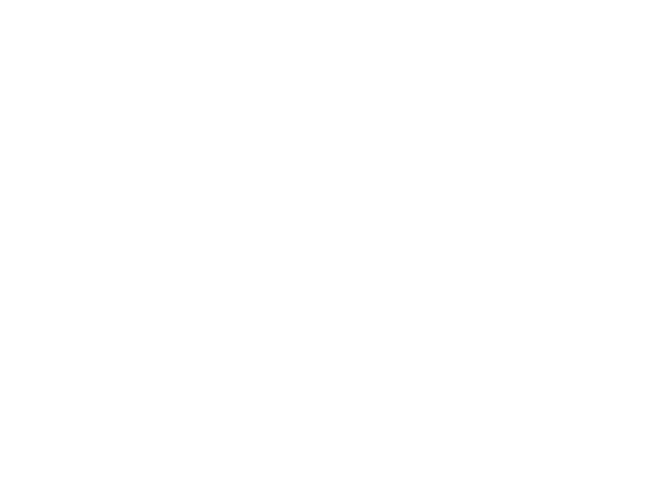

In [18]:
import matplotlib.pyplot as plt

# Draw the graph using matplotlib
pos = {node: node for node in G_channel.nodes()}  # Position the nodes at their coordinates
nx.draw(G_channel, pos, with_labels=False, node_size=10)
plt.show()


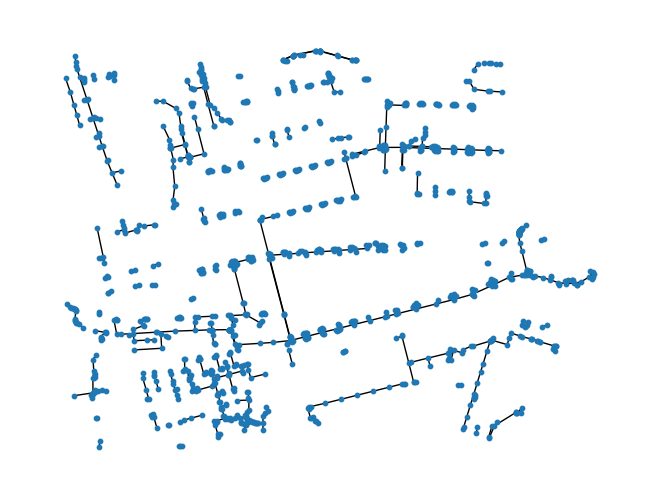

In [19]:
# Draw the storm main graph using matplotlib
pos = {node: node for node in G_storm_main.nodes()}  # Position the nodes at their coordinates
nx.draw(G_storm_main, pos, with_labels=False, node_size=10)
plt.show()

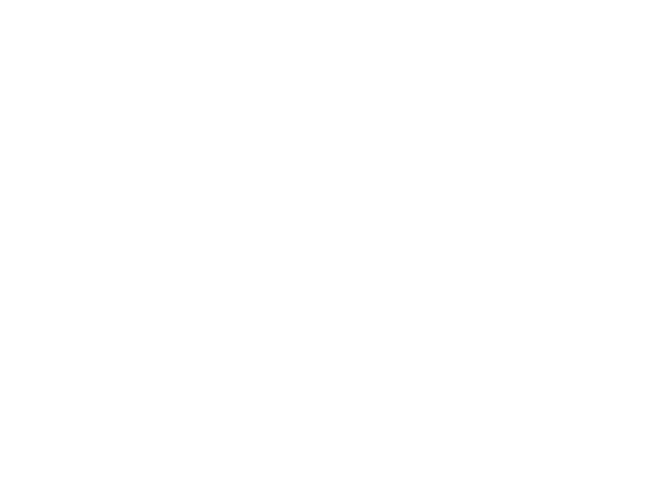

In [20]:
# Draw the graph using matplotlib
pos = {node: node for node in G_storm_structure.nodes()}  # Position the nodes at their coordinates
nx.draw(G_storm_structure, pos, with_labels=False, node_size=10)
plt.show()

In [21]:
%pip install contextily

Note: you may need to restart the kernel to use updated packages.


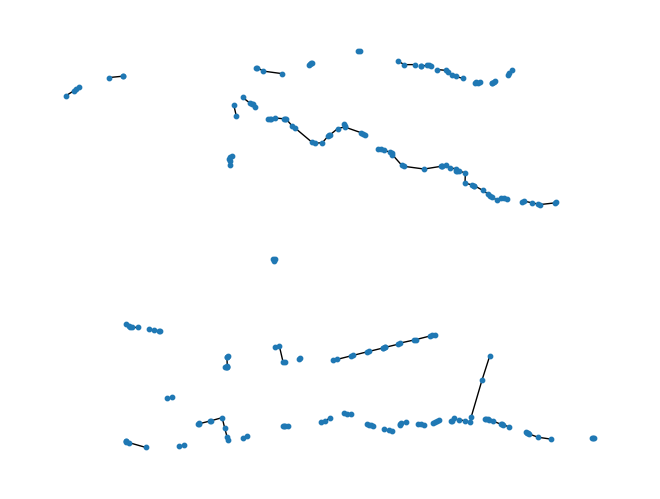

In [22]:
import matplotlib.pyplot as plt

# Draw the graph using matplotlib
pos = {node: node for node in G_culvert.nodes()}  # Position the nodes at their coordinates
nx.draw(G_culvert, pos, with_labels=False, node_size=10)
plt.show()

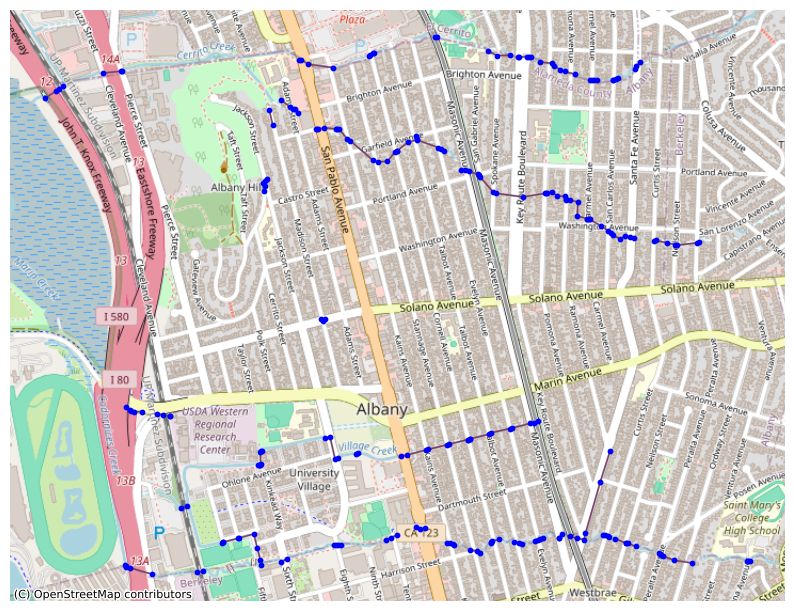

In [23]:
import contextily as ctx
import matplotlib.pyplot as plt


# Create a basemap using contextily
basemap = ctx.providers.OpenStreetMap.Mapnik

# Plot the basemap
ax_culvert = culvert_data.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_culvert, crs=culvert_data.crs, source=basemap)

# Plot the graph on top of the basemap
pos = {node: node for node in G_culvert.nodes()}  # Position the nodes at their coordinates
nx.draw(G_culvert, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_culvert)

plt.show()

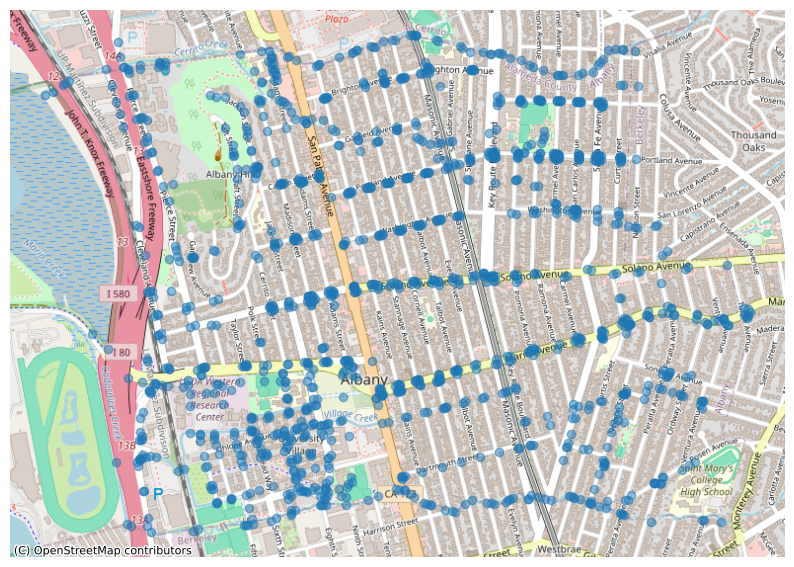

In [24]:
# Plot the basemap
ax_channel = channel_data.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_channel, crs=channel_data.crs, source=basemap)

# Plot the graph on top of the basemap
pos = {node: node for node in G_channel.nodes()}  # Position the nodes at their coordinates
nx.draw(G_channel, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_channel)

plt.show()

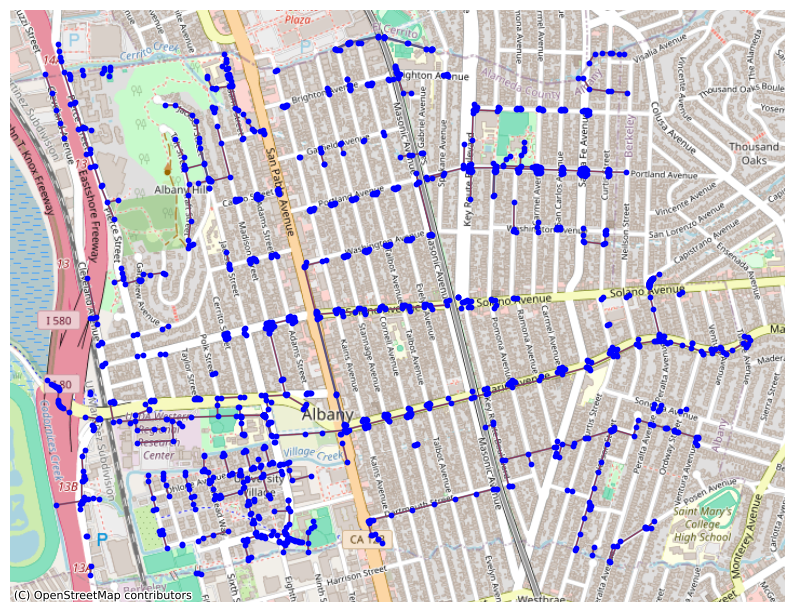

In [25]:
# Plot the basemap
ax_storm_main = storm_main.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_storm_main, crs=storm_main.crs, source=basemap)

# Plot the graph on top of the basemap
pos = {node: node for node in G_storm_main.nodes()}  # Position the nodes at their coordinates
nx.draw(G_storm_main, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_storm_main)

plt.show()

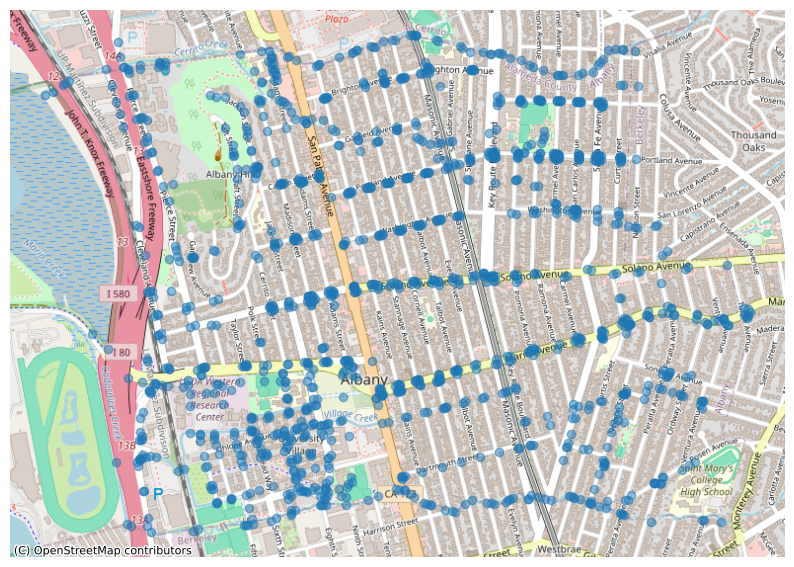

In [26]:
# Plot the basemap
ax_storm_structure = storm_structure.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_storm_structure, crs=storm_structure.crs, source=basemap)

# Plot the graph on top of the basemap
pos = {node: node for node in G_storm_structure.nodes()}  # Position the nodes at their coordinates
nx.draw(G_storm_structure, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_storm_structure)

plt.show()

Degree Centrality

In [27]:
# NODES = STORM MAIN STRUCTURES, LINKS = CHANNELS?

# ended up only analyzing over the storm main structures data.
# The links between the storm mains are pipes and other connections
# Cannot confirm if the links include channels, so we are assuming it's only pipes

In [28]:
G_storm_main.number_of_nodes()

1235

In [29]:
G_storm_main.number_of_nodes()

1235

In [30]:
G_storm_main.number_of_edges()

1096

In [31]:
print('Average clustering coefficient = ', nx.average_clustering(G_storm_main))
#print('Average shortest path length = ', nx.average_shortest_path_length(G_storm_main))
print ("Number of nodes:" , G_storm_main.number_of_nodes())
print ("Number of edges:" , G_storm_main.number_of_edges())
print ("2*Edges/N:" , 2*G_storm_main.number_of_edges()/G_storm_main.number_of_nodes())
print ("Average degree of the graph is = ",np.mean(list(dict(G_storm_main.degree()).values())))

# Cannot analyze over main graph because it's not connected

Average clustering coefficient =  0.0036437246963562753
Number of nodes: 1235
Number of edges: 1096
2*Edges/N: 1.7748987854251013
Average degree of the graph is =  1.7748987854251013


In [32]:
# determining all the connected components of the graph

connected_components = sorted(nx.connected_components(G_storm_main), key=len, reverse=True)

# Print the most connected networks
for i, component in enumerate(connected_components[:5]):
    print(f"Network {i+1}: {len(component)} nodes")

Network 1: 268 nodes
Network 2: 68 nodes
Network 3: 59 nodes
Network 4: 56 nodes
Network 5: 34 nodes


In [33]:
G_storm_main_sort = sorted(nx.connected_components(G_storm_main), key=len, reverse=True)


In [34]:
# determine the largest connected network

G_storm_main_sub = G_storm_main.subgraph(G_storm_main_sort[0])

In [35]:
G_storm_main_sub.number_of_nodes()

268

In [36]:
G_storm_main_sub.number_of_edges()

270

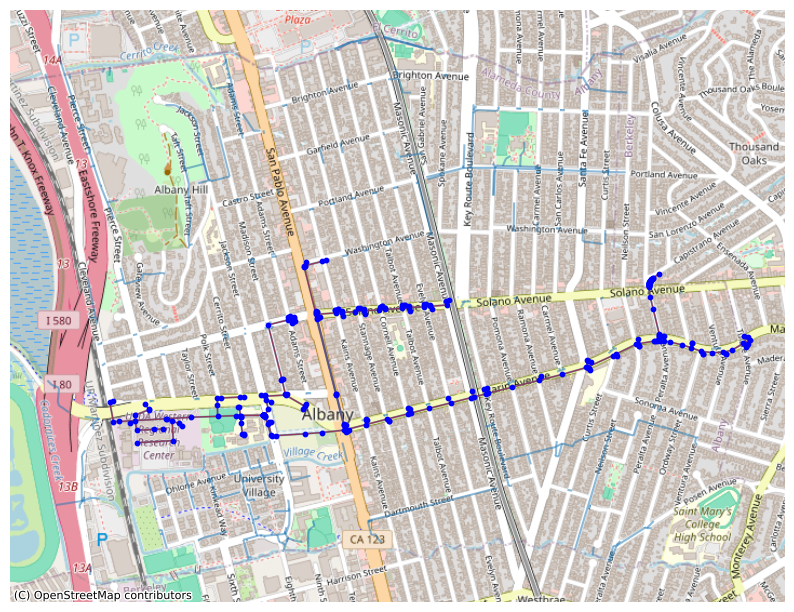

In [37]:
# Plot the basemap
ax_storm_main_sub = storm_main.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_storm_main_sub, crs=storm_main.crs, source=basemap)


# Plotting the subgraph on top of the basemap
pos = {node: node for node in G_storm_main_sub.nodes()}  # Position the nodes at their coordinates
nx.draw(G_storm_main_sub, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_storm_main_sub)

plt.show()

#this is the network we are analyzing

In [38]:
print('Average clustering coefficient = ', nx.average_clustering(G_storm_main_sub))
print('Average shortest path length = ', nx.average_shortest_path_length(G_storm_main_sub))
print ("Number of nodes:" , G_storm_main_sub.number_of_nodes())
print ("Number of edges:" , G_storm_main_sub.number_of_edges())
print ("2*Edges/N:" , 2*G_storm_main_sub.number_of_edges()/G_storm_main_sub.number_of_nodes())
print ("Average degree of the graph is = ",np.mean(list(dict(G_storm_main_sub.degree()).values())))

N_nodes= G_storm_main_sub.number_of_nodes()

Average clustering coefficient =  0.0
Average shortest path length =  30.869472860417016
Number of nodes: 268
Number of edges: 270
2*Edges/N: 2.014925373134328
Average degree of the graph is =  2.014925373134328


In [39]:
# Compute degree
degrees = dict(G_storm_main_sub.degree())
min_degree = min(degrees.values())
max_degree = max(degrees.values())
print(f"Minimum degree: {min_degree}")
print(f"Maximum degree: {max_degree}")

# Compute clustering coefficient
clustering_coeffs = nx.clustering(G_storm_main_sub)
min_clustering = min(clustering_coeffs.values())
max_clustering = max(clustering_coeffs.values())
print(f"Minimum clustering coefficient: {min_clustering}")
print(f"Maximum clustering coefficient: {max_clustering}")

# Compute shortest path length
shortest_path_lengths = dict(nx.shortest_path_length(G_storm_main_sub))
all_lengths = [length for target_lengths in shortest_path_lengths.values() for length in target_lengths.values()]
min_shortest_path = min(all_lengths)
max_shortest_path = max(all_lengths)
print(f"Minimum shortest path length: {min_shortest_path}")
print(f"Maximum shortest path length: {max_shortest_path}")

Minimum degree: 1
Maximum degree: 5
Minimum clustering coefficient: 0
Maximum clustering coefficient: 0
Minimum shortest path length: 0
Maximum shortest path length: 98


In [40]:
btwn_storm_main= nx.betweenness_centrality(G_storm_main_sub) #betweenness centrality values of the storm mains


---

Note: Betweeness centrality is a measure of a node's importance in the network. It quantifies the number of times a node acts as a bridge along the shortest path between two other nodes.

How often does a node lie on the shortest path between other nodes in the graph?

---




In [41]:
max_btwn_storm_main_nodes = sorted(btwn_storm_main, key=btwn_storm_main.get, reverse=True)[:5]
max_btwn_storm_main_nodes


[(-13614120.5409, 4563428.367899999),
 (-13614110.0874, 4563431.105800003),
 (-13614024.0898, 4563453.0227999985),
 (-13613931.01, 4563477.169500001),
 (-13613826.0508, 4563503.738799997)]

In [42]:
max_btwn_storm_main_vals = [btwn_storm_main[node] for node in max_btwn_storm_main_nodes]
max_btwn_storm_main_vals

[0.647855594041283,
 0.5059559009884261,
 0.4967474866942637,
 0.48801779730224437,
 0.48413167750837766]

In [43]:
min_btwn_storm_main_nodes = sorted(btwn_storm_main, key=btwn_storm_main.get)[:5]
min_btwn_storm_main_nodes

#which nodes have the minimum betweennness values? (all are zeros)


[(-13612913.7039, 4563757.2717999965),
 (-13613837.7146, 4563525.546999998),
 (-13614110.4489, 4563418.479699999),
 (-13613938.611, 4563969.6818),
 (-13613756.344, 4563988.2080999985)]

In [44]:
min_btwn_storm_main_vals = [btwn_storm_main[node] for node in min_btwn_storm_main_nodes]
min_btwn_storm_main_vals

[0.0, 0.0, 0.0, 0.0, 0.0]

In [45]:
zero_btwn_storm_main_nodes = [node for node in btwn_storm_main if btwn_storm_main[node] == 0]
zero_btwn_storm_main_nodes

#all of the nodes that have a betweenness centrality of zero

[(-13612913.7039, 4563757.2717999965),
 (-13613837.7146, 4563525.546999998),
 (-13614110.4489, 4563418.479699999),
 (-13613938.611, 4563969.6818),
 (-13613756.344, 4563988.2080999985),
 (-13614301.4093, 4563522.1526999995),
 (-13613829.0514, 4563955.796999998),
 (-13613039.9352, 4563702.5451000035),
 (-13614560.896200001, 4563575.630999997),
 (-13613951.5139, 4563975.736299999),
 (-13614470.2897, 4563584.444300003),
 (-13614019.5254, 4563472.457999997),
 (-13613042.4089, 4563732.193300001),
 (-13614398.66, 4563651.738899998),
 (-13614120.2828, 4563455.6844),
 (-13612815.828, 4563800.854000002),
 (-13613030.062199999, 4563730.773199998),
 (-13614442.876899999, 4563464.673100002),
 (-13612430.6546, 4563764.116700001),
 (-13614049.5254, 4563968.691200003),
 (-13612533.4013, 4563765.286600001),
 (-13615036.852699999, 4563372.800399996),
 (-13613554.303100001, 4563599.851999998),
 (-13615143.7039, 4563558.407399997),
 (-13613048.3531, 4563739.913400002),
 (-13615002.4379, 4563544.111100003)

In [46]:
avg_btwn_storm_main = sum(btwn_storm_main.values()) / len(btwn_storm_main)
avg_btwn_storm_main

0.11229125135495119

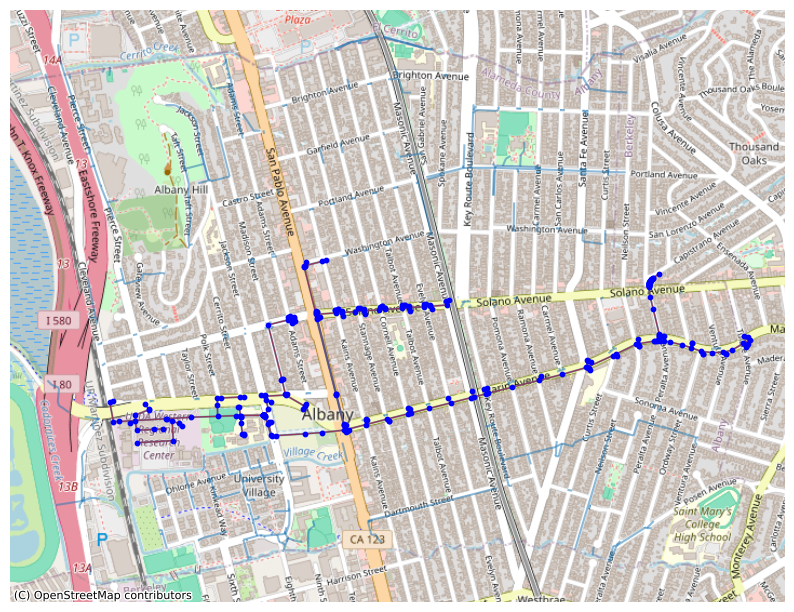

In [47]:
ax_storm_main = storm_main.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_storm_main, crs=storm_main.crs, source=basemap)

# Plot the graph on top of the basemap
# G_main_sub_new= nx.convert_node_labels_to_integers(G_main_sub, first_label=0)

pos = {node: node for node in G_storm_main_sub.nodes()}  # Position the nodes at their coordinates
nx.draw(G_storm_main_sub, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_storm_main)

plt.show()

## these mains serve as the network analyzed below, this is the largest connected component

In [48]:
import networkx as nx
from networkx.generators import *
import numpy as np
import matplotlib.pyplot as plt


#Computing betweeness
betCent = nx.betweenness_centrality(G_storm_main_sub, normalized=True, endpoints=True)

#Descending order sorting betweeness
betCent_sorted=dict(sorted(betCent.items(), key=lambda item: item[1],reverse=True))


#Color and size for regular nodes
color_list= N_nodes*['lightsteelblue'] ##make the original nodes blue
size_list= N_nodes*[5]

## nodes' indices are properly formatted here
node_indices = {node: idx for idx, node in enumerate(G_storm_main_sub.nodes())} #


In [49]:
#Getting indices on top 10 nodes for each measure
N_top=10

keys_bet_top=list(betCent_sorted)[0:N_top]

pos = {node: node for node in G_storm_main_sub.nodes()}  # Position the nodes at their coordinates
betCent_sorted_coord = {(pos[node][0], pos[node][1]): node_indices[node] for node in keys_bet_top}

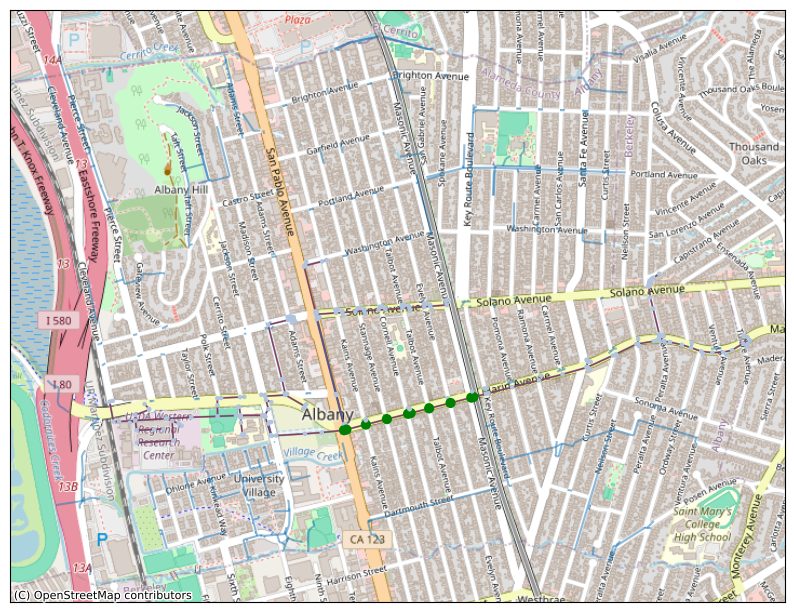

In [50]:
# Mapping the nodes with the highest betweeness centrality

for node_bet in betCent_sorted_coord:
  node_index = node_indices[node_bet]
  color_list[node_index] = 'g'  # make the high betweenness centrality nodes green
  size_list[node_index] = 40  # set the size to 40 for nodes with high betweenness centrality

ax_main = storm_main.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_main, crs=storm_main.crs, source=basemap)

nx.draw_networkx_nodes(G_storm_main_sub, pos, node_size=size_list, node_color=color_list)
nx.draw_networkx_edges(G_storm_main_sub, pos, edge_color='r')

In [51]:
betCent_sorted_coord

{(-13614120.5409, 4563428.367899999): 78,
 (-13614110.0874, 4563431.105800003): 261,
 (-13614024.0898, 4563453.0227999985): 76,
 (-13613931.01, 4563477.169500001): 242,
 (-13613826.0508, 4563503.738799997): 65,
 (-13613837.324000001, 4563500.821900003): 10,
 (-13613649.5615, 4563548.777400002): 227,
 (-13613744.1923, 4563524.7936): 26,
 (-13613547.992800001, 4563574.953000002): 48,
 (-13613557.7951, 4563572.321000002): 12}

In [53]:
#black and white map
# overlay the census tract map

In [54]:
# which nodes are being removed? Is this randomly removing 10 nodes?

C = G_storm_main_sub.copy()
N = G_storm_main_sub.number_of_nodes()

total_nodes_removed = 5
number_of_steps = N // total_nodes_removed

num_nodes_removed = range(0, N, number_of_steps)

targeted_attack_core_proportions = []
for nodes_removed in num_nodes_removed:
    # Measure the relative size of the network core
    core = max(nx.connected_components(C), key=len)
    core_proportion = len(core) / N

    targeted_attack_core_proportions.append(core_proportion)
    # If there are more than M nodes, select top M nodes and remove them
    if C.number_of_nodes() > total_nodes_removed:
        nodes_to_remove = max_btwn_storm_main_nodes
        C.remove_nodes_from(nodes_to_remove)



In [ ]:
total_nodes_removed = 5
targeted_attack_core_proportions = []

for node in max_btwn_storm_main_nodes:
    #make the copy in the loop so that each iteration starts with the original graph
    C = G_storm_main_sub.copy()

    #removes current node from the graph if it is present
    if C.has_node(node):
        C.remove_node(node)

# Measure the relative size of the network core
    core = max(nx.connected_components(C), key=len)
    core_proportion = len(core) / len(C)

# the core only has a size of 5 because there's only 5 connected components
# there's also only top 5 nodes with the highest betweeness centrality
# because the network is smaller than the other utilities

    targeted_attack_core_proportions.append(core_proportion)

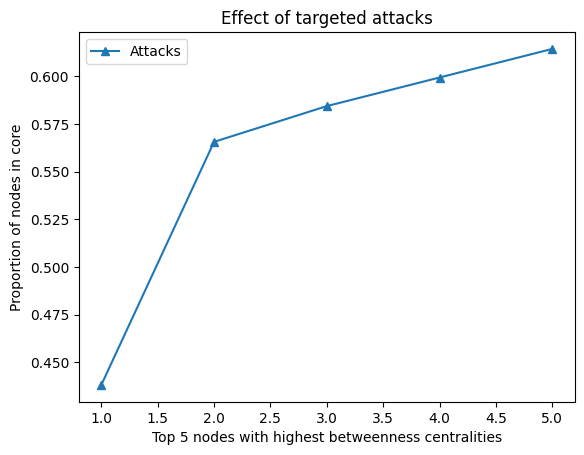

In [56]:
plt.title('Effect of targeted attacks')
plt.xlabel('Top 5 nodes with highest betweenness centralities')
plt.ylabel('Proportion of nodes in core')
plt.plot(range(1,6,1), targeted_attack_core_proportions, marker='^', label='Attacks')
plt.legend(loc=2, prop={'size': 10})
plt.legend()

In [57]:
betCent_sorted_coord

{(-13614120.5409, 4563428.367899999): 78,
 (-13614110.0874, 4563431.105800003): 261,
 (-13614024.0898, 4563453.0227999985): 76,
 (-13613931.01, 4563477.169500001): 242,
 (-13613826.0508, 4563503.738799997): 65,
 (-13613837.324000001, 4563500.821900003): 10,
 (-13613649.5615, 4563548.777400002): 227,
 (-13613744.1923, 4563524.7936): 26,
 (-13613547.992800001, 4563574.953000002): 48,
 (-13613557.7951, 4563572.321000002): 12}

In [58]:
# removing the most critical node - node 1
# why is node 1 most critical? Targeted attacks graph shows that the proportion of nodes in the core is lowest when this node is attacked and removed
#~42% of the network should remain after node 1 is removed

In [59]:
G_modified = nx.Graph()
coordinate_to_remove = (-13614120.5409, 4563428.367899999)

for geometry in storm_main['geometry']:
    if geometry.geom_type == 'LineString':
        coordinates_storm_main = list(geometry.coords)

        # Extract the start and end coordinates
        start_coord = coordinates_storm_main[0]
        end_coord = coordinates_storm_main[-1]

        # Add an edge between start and end coordinates
        G_modified.add_edge(start_coord, end_coord)

if G_modified.has_node(coordinate_to_remove):
    # Remove the node from the graph
    G_modified.remove_node(coordinate_to_remove)

    # Remove the corresponding row from the DataFrame
    storm_main = storm_main[~((storm_main['geometry'].apply(lambda x: x.coords[0] == coordinate_to_remove)) |
                           (storm_main['geometry'].apply(lambda x: x.coords[-1] == coordinate_to_remove)))]

In [60]:
G_modified_sort = sorted(nx.connected_components(G_modified), key=len, reverse=True) ## cut out the disconnected parts

In [61]:
G_modified_sub = G_modified.subgraph(G_modified_sort[0])

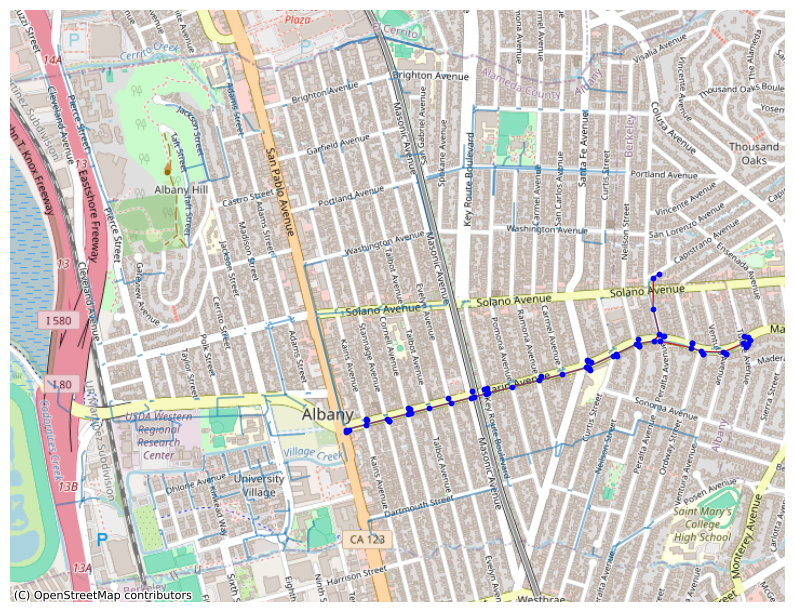

In [62]:
ax_storm_main = storm_main.plot(figsize=(10, 10), alpha=0.5)
ctx.add_basemap(ax_storm_main, crs=storm_main.crs, source=basemap)

# Plot the graph on top of the basemap

pos = {node: node for node in G_modified_sub.nodes()}  # Position the nodes at their coordinates
nx.draw(G_modified_sub, pos, node_size=10, with_labels=False, node_color='b', edge_color='r', ax=ax_storm_main)

plt.show()

## these mains serve as the network analyzed below, this is the largest connected component